# Setup

In [2]:
%load_ext autoreload
%autoreload 2

In [3]:
import warnings

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import seaborn as sns # visualization library
import matplotlib.pyplot as plt # visualization library
from plotly.offline import init_notebook_mode, iplot # plotly offline mode
import plotly.graph_objs as go # plotly graphical object


import src.data.timeseries_eda as eda 

init_notebook_mode(connected=True)
# ignore filters
warnings.filterwarnings("ignore") # if there is a warning after some codes, this will avoid us to see them.
plt.style.use('ggplot')

# config

In [4]:
symbol = 'EURUSD'

# EDA

In [5]:
market_data = pd.read_csv(f'data/{symbol}_1h.csv')
market_data.head()

,Unnamed: 0,open_time,open_bid,low_bid,high_bid,close_bid,volume_bid,open_ask,low_ask,high_ask,close_ask,volume_ask,close_time,month,year
0,0,2015-02-02 01:00:00,1.13082,1.13082,1.13157,1.13153,2712.48,1.13086,1.13086,1.13160,1.13156,2853.70,2015-02-02 02:00:00,2,2015
1,1,2015-02-02 02:00:00,1.13152,1.13135,1.13255,1.13179,2935.13,1.13156,1.13136,1.13257,1.13181,2945.25,2015-02-02 03:00:00,2,2015
2,2,2015-02-02 03:00:00,1.13180,1.13054,1.13180,1.13102,2610.78,1.13181,1.13057,1.13185,1.13103,2617.55,2015-02-02 04:00:00,2,2015
3,3,2015-02-02 04:00:00,1.13101,1.13084,1.13132,1.13084,1723.14,1.13103,1.13088,1.13136,1.13088,1489.47,2015-02-02 05:00:00,2,2015
4,4,2015-02-02 05:00:00,1.13085,1.13071,1.13134,1.13084,1966.10,1.13088,1.13073,1.13136,1.13085,1753.40,2015-02-02 06:00:00,2,2015


In [6]:
market_data['open_time'] = pd.to_datetime(market_data['open_time'])
market_data.set_index('open_time', inplace=True)
market_data.drop(columns='close_time', inplace=True)

In [7]:
stationary = eda.Stationary(market_data)

for feature in market_data.columns:
    stationary.check(feature)
    print('-'*20)

checking stationarity for Unnamed: 0
ADF Statistic: -180.97297030887822
p-value: 0.0
Is stationary: True
--------------------
checking stationarity for open_bid
ADF Statistic: -2.4627539457924263
p-value: 0.124801643948242
Is stationary: False
--------------------
checking stationarity for low_bid
ADF Statistic: -2.4987771684525986
p-value: 0.1157721364524879
Is stationary: False
--------------------
checking stationarity for high_bid
ADF Statistic: -2.4940436165518114
p-value: 0.11693031185668151
Is stationary: False
--------------------
checking stationarity for close_bid
ADF Statistic: -2.4787971492380656
p-value: 0.12071880386147238
Is stationary: False
--------------------
checking stationarity for volume_bid
ADF Statistic: -6.965295067226021
p-value: 8.947267332614734e-10
Is stationary: True
--------------------
checking stationarity for open_ask
ADF Statistic: -2.4648240775824894
p-value: 0.12426923243442084
Is stationary: False
--------------------
checking stationarity for low

checking stationarity for close_ask
ADF Statistic: -2.480550976383879
p-value: 0.12027847918721973
Is stationary: False


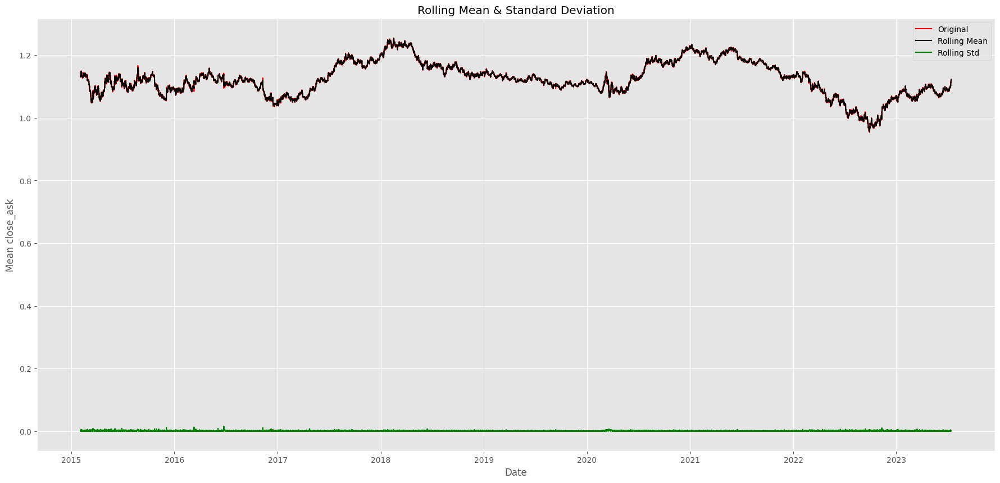

In [8]:
stationary.check('close_ask')
stationary.plot('close_ask')

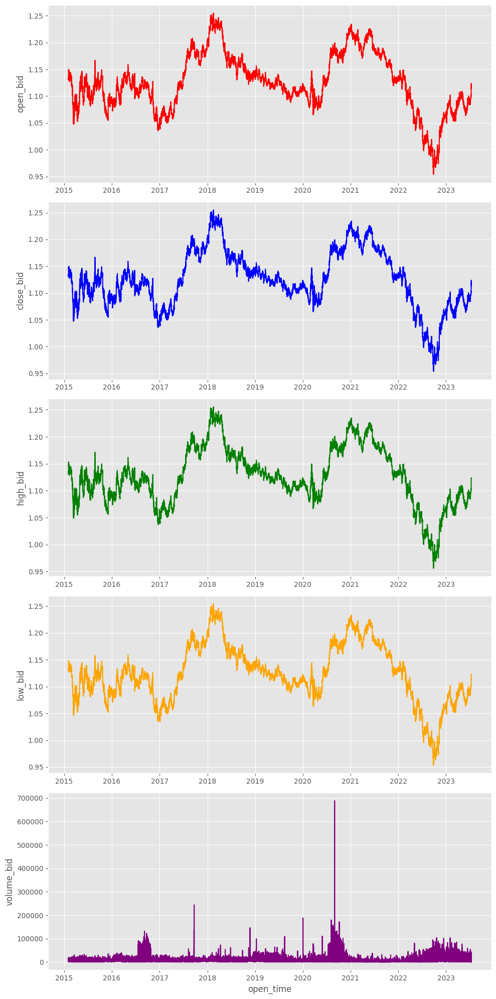

In [9]:
eda.plot_price_volume(market_data, kind = 'bid')

In [10]:
eda.plot_candlestick(market_data, kind = 'bid')

In [11]:
normality_checker = eda.Normality(market_data)
list_of_features_to_be_normalized = []
for col in market_data.columns:
    if normality_checker.check(col):
       continue
    list_of_features_to_be_normalized.append(col)
list_of_features_to_be_normalized 

['Unnamed: 0',
 'open_bid',
 'low_bid',
 'high_bid',
 'close_bid',
 'volume_bid',
 'open_ask',
 'low_ask',
 'high_ask',
 'close_ask',
 'volume_ask',
 'month',
 'year']

# Features Engineering

In [12]:
from src.data.feature_engineering import PercentageFeatureAdder, BollingerBandAdder, TargetAdder,Scalar

percentage_feature_adder = PercentageFeatureAdder(1)
bidbb_adder = BollingerBandAdder(kind = 'bid')
askbb_adder = BollingerBandAdder(kind = 'ask')


pipeline = [bidbb_adder, askbb_adder, percentage_feature_adder]

In [13]:
transformed = market_data.copy()
for idx , trans in enumerate(pipeline):
    print(f'Transformation number: {idx + 1}')
    transformed = trans.transform(transformed)

Transformation number: 1
Transformation number: 2
Transformation number: 3


In [14]:
stationary_checker = eda.Stationary(transformed)
normality_checker = eda.Normality(transformed)

ready_to_train_features = []
for col in transformed.columns:
    if not stationary_checker.check(col) :
       continue
    ready_to_train_features.append(col)

ready_to_train_features

checking stationarity for Unnamed: 0


ADF Statistic: -0.4786964044919784
p-value: 0.8961071336037401
Is stationary: False
checking stationarity for open_bid
ADF Statistic: -2.473211872347423
p-value: 0.12212894590271328
Is stationary: False
checking stationarity for low_bid
ADF Statistic: -2.488818586861005
p-value: 0.11821864083930733
Is stationary: False
checking stationarity for high_bid
ADF Statistic: -2.4839730054906273
p-value: 0.11942272295404788
Is stationary: False
checking stationarity for close_bid
ADF Statistic: -2.487968724873902
p-value: 0.11842917481029186
Is stationary: False
checking stationarity for volume_bid
ADF Statistic: -6.905789751500843
p-value: 1.2483024088338616e-09
Is stationary: True
checking stationarity for open_ask
ADF Statistic: -2.474866432570156
p-value: 0.12170996038703347
Is stationary: False
checking stationarity for low_ask
ADF Statistic: -2.488230007540732
p-value: 0.11836441861345248
Is stationary: False
checking stationarity for high_ask
ADF Statistic: -2.4838623315811272
p-value: 

['volume_bid',
 'volume_ask',
 'month',
 'bid_golden/death',
 'bid_standard_deviation',
 'bid_bollinger_touch',
 'ask_golden/death',
 'ask_standard_deviation',
 'ask_bollinger_touch',
 'hhpc_bid_1',
 'llpc_bid_1',
 'hhpc_bid_3',
 'llpc_bid_3',
 'hplpcp_bid_1',
 'hplpcp_bid_3',
 'hplpcp_bid_4',
 'vvpavg3_bid',
 'vvp3avg3_bid',
 'hc_bid',
 'ho_bid',
 'co_bid',
 'hhpc_ask_1',
 'llpc_ask_1',
 'hhpc_ask_3',
 'llpc_ask_3',
 'hplpcp_ask_1',
 'hplpcp_ask_3',
 'hplpcp_ask_4',
 'vvpavg3_ask',
 'vvp3avg3_ask',
 'hc_ask',
 'ho_ask',
 'co_ask']

In [15]:
target_adder = TargetAdder(step_number=1 , look_back_steps =2)
transformed

,Unnamed: 0,open_bid,low_bid,high_bid,close_bid,volume_bid,open_ask,low_ask,high_ask,close_ask,...,hhpc_ask_3,llpc_ask_3,hplpcp_ask_1,hplpcp_ask_3,hplpcp_ask_4,vvpavg3_ask,vvp3avg3_ask,hc_ask,ho_ask,co_ask
open_time,,,,,,,,,,,,,,,,,,,,,
2015-02-03 06:00:00,29,1.13314,1.13260,1.13392,1.13387,3575.43,1.13316,1.13263,1.13395,1.13391,...,-0.000564,-0.000194,0.000980,0.001536,0.000715,0.009180,-0.190700,0.000035,0.000697,0.000662
2015-02-03 07:00:00,30,1.13387,1.13271,1.13475,1.13316,7018.44,1.13391,1.13274,1.13478,1.13319,...,0.001288,0.000168,0.001164,0.000679,0.001534,0.809215,0.696656,0.001401,0.000767,-0.000635
2015-02-03 08:00:00,31,1.13316,1.13216,1.13518,1.13243,11231.82,1.13320,1.13218,1.13521,1.13246,...,0.001660,-0.000035,0.001800,0.000979,0.000679,0.503776,1.037695,0.002422,0.001771,-0.000653
2015-02-03 09:00:00,32,1.13244,1.13124,1.13437,1.13334,10326.65,1.13246,1.13127,1.13438,1.13340,...,0.000379,-0.001200,0.002676,0.001166,0.000980,-0.108077,0.688065,0.000864,0.001693,0.000830
2015-02-03 10:00:00,33,1.13332,1.13317,1.13547,1.13504,7146.93,1.13340,1.13319,1.13549,1.13508,...,0.000625,0.000396,0.002744,0.001800,0.001165,-0.239124,0.037527,0.000361,0.001841,0.001482
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-14 00:00:00,52651,1.12244,1.12217,1.12280,1.12237,6880.17,1.12248,1.12220,1.12283,1.12241,...,0.000027,-0.000205,0.000499,0.000330,0.000668,0.844133,0.731353,0.000374,0.000312,-0.000062
2023-07-14 01:00:00,52652,1.12237,1.12134,1.12247,1.12229,16004.12,1.12240,1.12136,1.12249,1.12233,...,-0.000178,-0.000535,0.000561,0.000650,0.000330,1.057975,1.699762,0.000143,0.000080,-0.000062
2023-07-14 02:00:00,52653,1.12229,1.12221,1.12337,1.12336,19662.13,1.12232,1.12224,1.12341,1.12340,...,0.000374,-0.000169,0.001007,0.000499,0.000650,0.204334,1.104133,0.000009,0.000970,0.000962


In [16]:
target_adder.transform(transformed)

,Unnamed: 0,open_bid,low_bid,high_bid,close_bid,volume_bid,open_ask,low_ask,high_ask,close_ask,...,hplpcp_ask_4,vvpavg3_ask,vvp3avg3_ask,hc_ask,ho_ask,co_ask,high_bid_change_rate_target,low_ask_change_rate_target,last_open_ask,last_open_bid
open_time,,,,,,,,,,,,,,,,,,,,,
2015-02-03 06:00:00,29,1.13314,1.13260,1.13392,1.13387,3575.43,1.13316,1.13263,1.13395,1.13391,...,0.000715,0.009180,-0.190700,0.000035,0.000697,0.000662,NaN,NaN,NaN,NaN
2015-02-03 07:00:00,30,1.13387,1.13271,1.13475,1.13316,7018.44,1.13391,1.13274,1.13478,1.13319,...,0.001534,0.809215,0.696656,0.001401,0.000767,-0.000635,NaN,NaN,NaN,NaN
2015-02-03 08:00:00,31,1.13316,1.13216,1.13518,1.13243,11231.82,1.13320,1.13218,1.13521,1.13246,...,0.000679,0.503776,1.037695,0.002422,0.001771,-0.000653,0.178263,0.084720,1.13316,1.13314
2015-02-03 09:00:00,32,1.13244,1.13124,1.13437,1.13334,10326.65,1.13246,1.13127,1.13438,1.13340,...,0.000980,-0.108077,0.688065,0.000864,0.001693,0.000830,0.040570,0.229299,1.13391,1.13387
2015-02-03 10:00:00,33,1.13332,1.13317,1.13547,1.13504,7146.93,1.13340,1.13319,1.13549,1.13508,...,0.001165,-0.239124,0.037527,0.000361,0.001841,0.001482,0.200316,-0.002651,1.13320,1.13316
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2023-07-14 00:00:00,52651,1.12244,1.12217,1.12280,1.12237,6880.17,1.12248,1.12220,1.12283,1.12241,...,0.000668,0.844133,0.731353,0.000374,0.000312,-0.000062,0.036526,0.016038,1.12239,1.12238
2023-07-14 01:00:00,52652,1.12237,1.12134,1.12247,1.12229,16004.12,1.12240,1.12136,1.12249,1.12233,...,0.000330,1.057975,1.699762,0.000143,0.000080,-0.000062,-0.002666,0.096222,1.12250,1.12244
2023-07-14 02:00:00,52653,1.12229,1.12221,1.12337,1.12336,19662.13,1.12232,1.12224,1.12341,1.12340,...,0.000650,0.204334,1.104133,0.000009,0.000970,0.000962,0.079290,0.017821,1.12248,1.12244


In [17]:
normality_checker = eda.Normality(transformed.iloc[-2000:])

In [18]:
normality_checker.check('high_bid_change_rate_target')

False

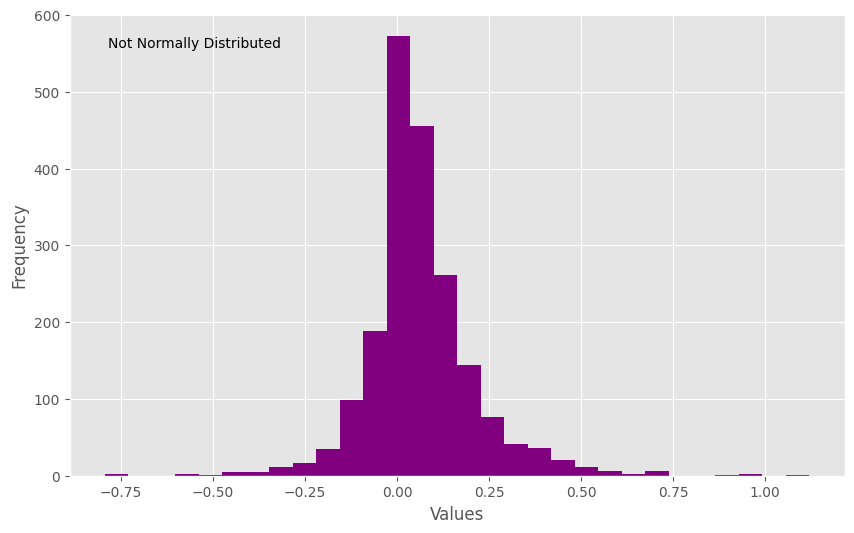

In [19]:
normality_checker.plot('high_bid_change_rate_target')

<Axes: >

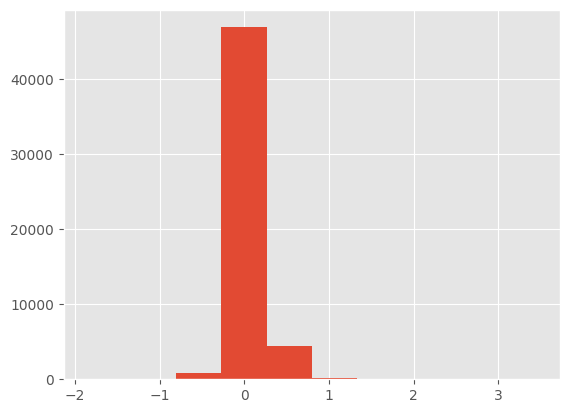

In [20]:
transformed['high_bid_change_rate_target'].hist()

In [21]:
# add retransform method to the target adder (goining from target to abs price) dobe 
# Scaler(Tranformer) , transform and retransform , scale a set of input features (fit, transform, retransform) done 
# Dataset class for your Pytorch model  
# train your model and try to refactor the training code to be re-usable
# evaluatin of models think about adding metrics and plots 
# move the Wavelet to the feature eng part and make it as a Tranformer: implementation done 
#    * denoise input data then make features 
#    * denoise the features directly 
# prepare in the evalutaion part a way to copmare the models performance 
# add the mlp auto-encoder denoiser and try to copmare results ( no-denoising vs wavelet vs auto-encoder) 

In [22]:
transformed.columns

Index(['Unnamed: 0', 'open_bid', 'low_bid', 'high_bid', 'close_bid',
       'volume_bid', 'open_ask', 'low_ask', 'high_ask', 'close_ask',
       'volume_ask', 'month', 'year', 'bid_golden/death',
       'bid_standard_deviation', 'bid_upper_band', 'bid_lower_band',
       'bid_middle_band', 'bid_bollinger_touch', 'ask_golden/death',
       'ask_standard_deviation', 'ask_upper_band', 'ask_lower_band',
       'ask_middle_band', 'ask_bollinger_touch', 'hhpc_bid_1', 'llpc_bid_1',
       'hhpc_bid_3', 'llpc_bid_3', 'hplpcp_bid_1', 'hplpcp_bid_3',
       'hplpcp_bid_4', 'vvpavg3_bid', 'vvp3avg3_bid', 'hc_bid', 'ho_bid',
       'co_bid', 'hhpc_ask_1', 'llpc_ask_1', 'hhpc_ask_3', 'llpc_ask_3',
       'hplpcp_ask_1', 'hplpcp_ask_3', 'hplpcp_ask_4', 'vvpavg3_ask',
       'vvp3avg3_ask', 'hc_ask', 'ho_ask', 'co_ask',
       'high_bid_change_rate_target', 'low_ask_change_rate_target',
       'last_open_ask', 'last_open_bid'],
      dtype='object')

In [23]:
feature=ready_to_train_features
target=['high_bid_change_rate_target', 'low_ask_change_rate_target']

# Models Training

In [24]:
from src.data.dataloader import CreateDataset

my_dataset = CreateDataset(transformed, 10, feature, target)

train_data, valid_data, test_data = my_dataset.dataset_split(0.7,0.2)

In [25]:
from src.data.feature_engineering import Scalar
scalar = Scalar()
train_data[feature] = scalar.fit_transform(train_data[feature]) #use it for denoise


In [26]:
#MLP Autoencoder
from src.models.autoencoder import Autoencoder
mlpae_train= train_data[feature].values
autoencoder = Autoencoder(len(feature))
autoencoder.fit(mlpae_train)
data_with_noise=transformed[feature].values
transformed[feature]=autoencoder.transform(data_with_noise)

Data Shuffled
Epoch 1/10 | Step 0/574 | train loss: 584.0447 | l1 loss: 583.0784 | sparsity loss: 4.8314
Epoch 1/10 | Step 50/574 | train loss: 197.3932 | l1 loss: 196.4630 | sparsity loss: 4.6509
Epoch 1/10 | Step 100/574 | train loss: 56.8463 | l1 loss: 55.9243 | sparsity loss: 4.6100
Epoch 1/10 | Step 150/574 | train loss: 22.0003 | l1 loss: 21.0824 | sparsity loss: 4.5894
Epoch 1/10 | Step 200/574 | train loss: 3.9695 | l1 loss: 3.0536 | sparsity loss: 4.5791
Epoch 1/10 | Step 250/574 | train loss: 3.0202 | l1 loss: 2.1047 | sparsity loss: 4.5774
Epoch 1/10 | Step 300/574 | train loss: 3.5813 | l1 loss: 2.6666 | sparsity loss: 4.5738
Epoch 1/10 | Step 350/574 | train loss: 3.3638 | l1 loss: 2.4492 | sparsity loss: 4.5729
Epoch 1/10 | Step 400/574 | train loss: 3.6234 | l1 loss: 2.7096 | sparsity loss: 4.5693
Epoch 1/10 | Step 450/574 | train loss: 4.4879 | l1 loss: 3.5748 | sparsity loss: 4.5655
Epoch 1/10 | Step 500/574 | train loss: 3.4763 | l1 loss: 2.5634 | sparsity loss: 4.564

In [27]:
#after denoise, recreate 
my_dataset = CreateDataset(transformed, 10, feature, target)

train_data, valid_data, test_data = my_dataset.dataset_split(0.7,0.2)
train_data[feature] = scalar.fit_transform(train_data[feature]) 
valid_data[feature] = scalar.transform(valid_data[feature])
test_data[feature] = scalar.transform(test_data[feature])

train_dataset = my_dataset.create_dataset(train_data)
valid_dataset = my_dataset.create_dataset(valid_data)
test_dataset = my_dataset.create_dataset(test_data)

train_loader = my_dataset.create_loader(train_dataset, 128)
valid_loader = my_dataset.create_loader(valid_dataset, 128)
test_loader = my_dataset.create_loader(test_dataset, 128)

In [28]:
DEVICE = 'cuda' 
BATCH_SIZE = 32 
MAX_WAIT = 3
EPOCHS = 25 
LR = 1e-4

In [29]:
from src.models import nn_trainer, lstm_forecaster
import torch
import torch.nn as nn
import torch.optim.lr_scheduler as lr_scheduler

rnn_model = lstm_forecaster.RNN(
    input_size = len(feature),
    output_size = 2 
    )

loss_fn = nn.MSELoss() 
optimizer = torch.optim.AdamW(params = rnn_model.parameters() , lr = LR)
scheduler = lr_scheduler.StepLR(optimizer, step_size=10, gamma=0.1)

In [30]:

train_rnn = nn_trainer.Trainer(rnn_model , optimizer , train_loader , valid_loader, EPOCHS, MAX_WAIT, DEVICE, loss_fn,scheduler)
train_losses , valid_losses = train_rnn.fit()

  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 0
train_loss = 0.030429399690345034
valid_loss = 0.023077099348407192


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 1
train_loss = 0.029911339029139426
valid_loss = 0.02307136627811804


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 2
train_loss = 0.0299255732097663
valid_loss = 0.02305661543575396


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 3
train_loss = 0.029928598157615244
valid_loss = 0.02303846477788974


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 4
train_loss = 0.029943480856470868
valid_loss = 0.02307022198563419


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 5
train_loss = 0.02993938583838624
valid_loss = 0.023032395180359662


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 6
train_loss = 0.029947858666774765
valid_loss = 0.023044509706592345


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 7
train_loss = 0.029928762593448885
valid_loss = 0.02303817506924451


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 8
train_loss = 0.029952829753811885
valid_loss = 0.0230364200030734


  0%|          | 0/288 [00:00<?, ?it/s]

  0%|          | 0/83 [00:00<?, ?it/s]

EPOCH = 9
train_loss = 0.02995824293369272
valid_loss = 0.023037352907774318
EARLY STOPPING AT EPOCH = 9


# Evaluation

In [31]:
from src.eval.metrics import ForecastEval

In [32]:
indexes , high_bid_predictions, low_ask_predictions = train_rnn.predict(test_loader)
indexes_datetime = pd.to_datetime(indexes)

In [33]:
predictions = pd.DataFrame(
    data = {
        'high_bid_change_rate_target': high_bid_predictions,
        'low_ask_change_rate_target': low_ask_predictions,
    },
    index = indexes_datetime
)   
predictions[['last_open_ask','last_open_bid']] = test_data[['last_open_ask','last_open_bid']]
predictions.head()

,high_bid_change_rate_target,low_ask_change_rate_target,last_open_ask,last_open_bid
2022-09-06 01:00:00,0.064092,0.059499,0.99420,0.99413
2022-09-06 02:00:00,0.063661,0.059823,0.99506,0.99501
2022-09-06 03:00:00,0.063521,0.059950,0.99689,0.99682
2022-09-06 04:00:00,0.063512,0.059977,0.99643,0.99640
2022-09-06 05:00:00,0.065233,0.059721,0.99590,0.99585


In [34]:
predictions = target_adder.retransform(predictions)

In [35]:
orginal_test_data = market_data[['open_ask','open_bid','low_ask','high_bid']].loc[predictions.index]

<Axes: >

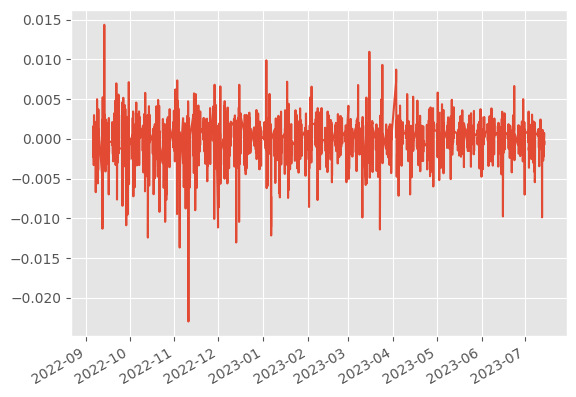

In [36]:
(predictions['high_bid'] - orginal_test_data['high_bid']).plot()

Position Accuracy: 4.00%
ABS error:  29228.714461959473


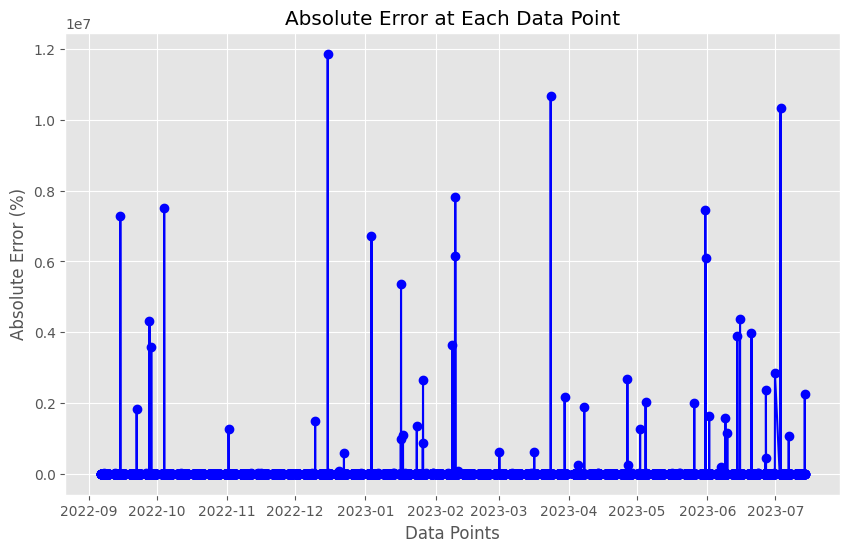

In [37]:
evaluator= ForecastEval(orginal_data= orginal_test_data , predicted_data = predictions)
evaluator.run_evaluation()

In [38]:
(orginal_test_data['high_bid']>predictions['high_bid']).mean()*100

46.417682926829265

In [39]:
(orginal_test_data['low_ask']>predictions['low_ask']).mean()*100

54.09679878048781

In [41]:
orginal_test_data.to_csv('data/predictions/original_test_data_with_MLPAE.csv')
predictions.to_csv('data/predictions/predictions_with_MLPAE.csv')